# A walk through latent space with Stable Diffusion

**Authors:** Ian Stenbit, [fchollet](https://twitter.com/fchollet), [lukewood](https://twitter.com/luke_wood_ml)<br>
**Date created:** 2022/09/28<br>
**Last modified:** 2022/09/28<br>
**Description:** Explore the latent manifold of Stable Diffusion.

## Overview

Generative image models learn a "latent manifold" of the visual world:
a low-dimensional vector space where each point maps to an image.
Going from such a point on the manifold back to a displayable image
is called "decoding" -- in the Stable Diffusion model, this is handled by
the "decoder" model.

![The Stable Diffusion architecture](https://i.imgur.com/2uC8rYJ.png)

This latent manifold of images is continuous and interpolative, meaning that:

1. Moving a little on the manifold only changes the corresponding image a little (continuity).
2. For any two points A and B on the manifold (i.e. any two images), it is possible
to move from A to B via a path where each intermediate point is also on the manifold (i.e.
is also a valid image). Intermediate points would be called "interpolations" between
the two starting images.

Stable Diffusion isn't just an image model, though, it's also a natural language model.
It has two latent spaces: the image representation space learned by the
encoder used during training, and the prompt latent space
which is learned using a combination of pretraining and training-time
fine-tuning.

_Latent space walking_, or _latent space exploration_, is the process of
sampling a point in latent space and incrementally changing the latent
representation. Its most common application is generating animations
where each sampled point is fed to the decoder and is stored as a
frame in the final animation.
For high-quality latent representations, this produces coherent-looking
animations. These animations can provide insight into the feature map of the
latent space, and can ultimately lead to improvements in the training
process. One such GIF is displayed below:

![Panda to Plane](/img/examples/generative/random_walks_with_stable_diffusion/panda2plane.gif)

In this guide, we will show how to take advantage of the Stable Diffusion API
in KerasCV to perform prompt interpolation and circular walks through
Stable Diffusion's visual latent manifold, as well as through
the text encoder's latent manifold.

This guide assumes the reader has a
high-level understanding of Stable Diffusion.
If you haven't already, you should start
by reading the [Stable Diffusion Tutorial](https://keras.io/guides/keras_cv/generate_images_with_stable_diffusion/).

To start, we import KerasCV and load up a Stable Diffusion model using the
optimizations discussed in the tutorial
[Generate images with Stable Diffusion](https://keras.io/guides/keras_cv/generate_images_with_stable_diffusion/).
Note that if you are running with a M1 Mac GPU you should not enable mixed precision.

In [1]:
!pip install keras-cv --upgrade --quiet

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 650.7/650.7 kB 11.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 950.8/950.8 kB 40.8 MB/s eta 0:00:00


In [2]:
# Bones! El codi ha estat pràcticament reescrit senser, amb ajuda de documentació, IA i paciència perquè el original no anava.
# Després de mirar el fórum, vaig veure que la alternativa es PyTorch, així que se ha empleat per fer-ho.

import keras_cv
import keras
import matplotlib.pyplot as plt
import tensorflow as tf
import numpy as np
import math
from PIL import Image
import torch
import numpy as np
from diffusers import StableDiffusionPipeline

gpus = tf.config.list_physical_devices('GPU')
if gpus:
    try:
        for gpu in gpus:
            tf.config.experimental.set_memory_growth(gpu, True)
    except RuntimeError as e:
        print(e)

try:
    keras.mixed_precision.set_global_policy("mixed_float16")
except:
    print("Mixed precision not enabled")

model = keras_cv.models.StableDiffusion(
    img_width=512,
    img_height=512,
    jit_compile=False
)

By using this model checkpoint, you acknowledge that its usage is subject to the terms of the CreativeML Open RAIL-M license at https://raw.githubusercontent.com/CompVis/stable-diffusion/main/LICENSE


## Interpolating between text prompts

In Stable Diffusion, a text prompt is first encoded into a vector,
and that encoding is used to guide the diffusion process.
The latent encoding vector has shape
77x768 (that's huge!), and when we give Stable Diffusion a text prompt, we're
generating images from just one such point on the latent manifold.

To explore more of this manifold, we can interpolate between two text encodings
and generate images at those interpolated points:

In [3]:
pipe = StableDiffusionPipeline.from_pretrained(
    "runwayml/stable-diffusion-v1-5",
    torch_dtype=torch.float16
)
# He empleat colab pro amb la GPU A100, que és una NVIDIA de chipset A100, per millorar el rendiment
pipe = pipe.to("cuda")

prompt_1 = "A group of colorful planets floating in the space, each with its unique features like rings, moons, and swirling clouds"
prompt_2 = "A group of billiard balls with numbers on a green pool table, reflecting bright lights from above"
interpolation_steps = 5

def interpolate_embeddings(pipe, prompt1, prompt2, alpha, noise_strength=0.0):
    text_embeds_1 = pipe.encode_prompt(prompt1, device="cuda", num_images_per_prompt=1, do_classifier_free_guidance=False)
    text_embeds_2 = pipe.encode_prompt(prompt2, device="cuda", num_images_per_prompt=1, do_classifier_free_guidance=False)

    if isinstance(text_embeds_1, tuple):
        text_embeds_1 = text_embeds_1[0]
    if isinstance(text_embeds_2, tuple):
        text_embeds_2 = text_embeds_2[0]

    text_embeds_1 = text_embeds_1.to(dtype=torch.float32)
    text_embeds_2 = text_embeds_2.to(dtype=torch.float32)

    interpolated_embeds = (1 - alpha) * text_embeds_1 + alpha * text_embeds_2

    if noise_strength > 0:
        noise = torch.randn_like(interpolated_embeds) * noise_strength
        interpolated_embeds = interpolated_embeds + noise

    return interpolated_embeds

alphas = np.linspace(0, 1, interpolation_steps)
interpolated_encodings = []

for alpha in alphas:
    encoding = interpolate_embeddings(pipe, prompt_1, prompt_2, alpha)
    interpolated_encodings.append(encoding)

print(f"Encoding shape: {interpolated_encodings[0].shape}")

/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


model_index.json:   0%|          | 0.00/541 [00:00<?, ?B/s]

Fetching 15 files:   0%|          | 0/15 [00:00<?, ?it/s]

config.json:   0%|          | 0.00/617 [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/472 [00:00<?, ?B/s]

preprocessor_config.json:   0%|          | 0.00/342 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/4.72k [00:00<?, ?B/s]

scheduler_config.json:   0%|          | 0.00/308 [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/1.22G [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/492M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/806 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/3.44G [00:00<?, ?B/s]

config.json:   0%|          | 0.00/547 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/743 [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

Encoding shape: torch.Size([1, 77, 768])


Once we've interpolated the encodings, we can generate images from each point.
Note that in order to maintain some stability between the resulting images we
keep the diffusion noise constant between images.

In [4]:
seed = 12345
torch.manual_seed(seed)
generator = torch.Generator(device="cuda").manual_seed(seed)

images = []
for encoding in interpolated_encodings:
    with torch.no_grad():
        image = pipe(
            prompt_embeds=encoding,
            guidance_scale=7.5,
            num_inference_steps=50,
            generator=generator
        ).images[0]

    images.append(image)

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Now that we've generated some interpolated images, let's take a look at them!

Throughout this tutorial, we're going to export sequences of images as gifs so
that they can be easily viewed with some temporal context. For sequences of
images where the first and last images don't match conceptually, we rubber-band
the gif.

If you're running in Colab, you can view your own GIFs by running:

```
from IPython.display import Image as IImage
IImage("doggo-and-fruit-5.gif")
```

In [5]:
def export_as_gif(filename, images, frames_per_second=10, rubber_band=False):
    if rubber_band:
        images += images[2:-1][::-1]
    images[0].save(
        filename,
        save_all=True,
        append_images=images[1:],
        duration=1000 // frames_per_second,
        loop=0,
    )


export_as_gif(
    "planets-to-billiard.gif",
    images,
    frames_per_second=2,
    rubber_band=True,
)

![Planets to billiard balls](https://imgur.com/oRgn4Az.gif)

The results may seem surprising. Generally, interpolating between prompts
produces coherent looking images, and often demonstrates a progressive concept
shift between the contents of the two prompts. This is indicative of a high
quality representation space, that closely mirrors the natural structure
of the visual world.

To best visualize this, we should do a much more fine-grained interpolation,
using hundreds of steps. In order to keep batch size small (so that we don't
OOM our GPU), this requires manually batching our interpolated
encodings.

In [6]:
from tqdm import tqdm

interpolation_steps = 150
batch_size = 3
batches = interpolation_steps // batch_size

alphas = np.linspace(0, 1, interpolation_steps)
images = []

for batch_idx in tqdm(range(batches)):
    batch_start = batch_idx * batch_size
    batch_end = batch_start + batch_size
    batch_alphas = alphas[batch_start:batch_end]

    batch_encodings = []
    for alpha in batch_alphas:
        encoding = interpolate_embeddings(pipe, prompt_1, prompt_2, alpha)
        batch_encodings.append(encoding)

    for encoding in batch_encodings:
        with torch.no_grad():
            image = pipe(
                prompt_embeds=encoding,
                guidance_scale=7.5,
                num_inference_steps=25,
                generator=generator
            ).images[0]

        images.append(image)

export_as_gif("example2.gif", images, rubber_band=True)
print("GIF with 150 steps created successfully!")

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  2%|▏         | 1/50 [00:03<03:04,  3.76s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  4%|▍         | 2/50 [00:07<03:01,  3.79s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  6%|▌         | 3/50 [00:11<02:58,  3.79s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  8%|▊         | 4/50 [00:15<02:54,  3.80s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

 10%|█         | 5/50 [00:19<02:52,  3.82s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

 12%|█▏        | 6/50 [00:22<02:47,  3.82s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

 14%|█▍        | 7/50 [00:26<02:44,  3.81s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

 16%|█▌        | 8/50 [00:30<02:40,  3.81s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

 18%|█▊        | 9/50 [00:34<02:35,  3.80s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

 20%|██        | 10/50 [00:38<02:32,  3.80s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

 22%|██▏       | 11/50 [00:41<02:28,  3.82s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

 24%|██▍       | 12/50 [00:45<02:24,  3.81s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

 26%|██▌       | 13/50 [00:49<02:21,  3.82s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

 28%|██▊       | 14/50 [00:53<02:17,  3.83s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

 30%|███       | 15/50 [00:57<02:14,  3.83s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

 32%|███▏      | 16/50 [01:01<02:09,  3.82s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

 34%|███▍      | 17/50 [01:04<02:06,  3.83s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

 36%|███▌      | 18/50 [01:08<02:02,  3.81s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

 38%|███▊      | 19/50 [01:12<01:58,  3.84s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

 40%|████      | 20/50 [01:16<01:55,  3.84s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

 42%|████▏     | 21/50 [01:20<01:51,  3.83s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

 44%|████▍     | 22/50 [01:23<01:47,  3.82s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

 46%|████▌     | 23/50 [01:27<01:43,  3.82s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

 48%|████▊     | 24/50 [01:31<01:39,  3.81s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

 50%|█████     | 25/50 [01:35<01:35,  3.82s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

 52%|█████▏    | 26/50 [01:39<01:31,  3.82s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

 54%|█████▍    | 27/50 [01:43<01:27,  3.81s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

 56%|█████▌    | 28/50 [01:46<01:24,  3.82s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

 58%|█████▊    | 29/50 [01:50<01:20,  3.83s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

 60%|██████    | 30/50 [01:54<01:16,  3.82s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

 62%|██████▏   | 31/50 [01:58<01:12,  3.83s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

 64%|██████▍   | 32/50 [02:02<01:09,  3.83s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

 66%|██████▌   | 33/50 [02:06<01:05,  3.83s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

 68%|██████▊   | 34/50 [02:09<01:01,  3.83s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

 70%|███████   | 35/50 [02:13<00:57,  3.82s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

 72%|███████▏  | 36/50 [02:17<00:53,  3.80s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

 74%|███████▍  | 37/50 [02:21<00:49,  3.83s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

 76%|███████▌  | 38/50 [02:25<00:45,  3.82s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

 78%|███████▊  | 39/50 [02:28<00:41,  3.81s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

 80%|████████  | 40/50 [02:32<00:38,  3.81s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

 82%|████████▏ | 41/50 [02:36<00:34,  3.82s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

 84%|████████▍ | 42/50 [02:40<00:30,  3.80s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

 86%|████████▌ | 43/50 [02:44<00:26,  3.82s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

 88%|████████▊ | 44/50 [02:47<00:22,  3.81s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

 90%|█████████ | 45/50 [02:51<00:19,  3.80s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

 92%|█████████▏| 46/50 [02:55<00:15,  3.81s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

 94%|█████████▍| 47/50 [02:59<00:11,  3.81s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

 96%|█████████▌| 48/50 [03:03<00:07,  3.82s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

 98%|█████████▊| 49/50 [03:07<00:03,  3.82s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

100%|██████████| 50/50 [03:10<00:00,  3.82s/it]


GIF with 150 steps created successfully!


![Dog to Fruit 150](/img/examples/generative/random_walks_with_stable_diffusion/dog2fruit150.gif)

The resulting gif shows a much clearer and more coherent shift between the two
prompts. Try out some prompts of your own and experiment!

We can even extend this concept for more than one image. For example, we can
interpolate between four prompts:

Generating 6x6 interpolation grid in 12 batches...


  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  8%|▊         | 1/12 [00:04<00:51,  4.64s/it]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

 17%|█▋        | 2/12 [00:09<00:45,  4.60s/it]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

 25%|██▌       | 3/12 [00:13<00:41,  4.63s/it]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

 33%|███▎      | 4/12 [00:18<00:37,  4.63s/it]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

 42%|████▏     | 5/12 [00:23<00:32,  4.62s/it]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

 50%|█████     | 6/12 [00:27<00:27,  4.62s/it]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

 58%|█████▊    | 7/12 [00:32<00:23,  4.63s/it]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

 67%|██████▋   | 8/12 [00:37<00:18,  4.63s/it]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

 75%|███████▌  | 9/12 [00:41<00:13,  4.63s/it]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

 83%|████████▎ | 10/12 [00:46<00:09,  4.63s/it]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

 92%|█████████▏| 11/12 [00:50<00:04,  4.62s/it]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

100%|██████████| 12/12 [00:55<00:00,  4.62s/it]


Grid saved as 4-way-interpolation.jpg


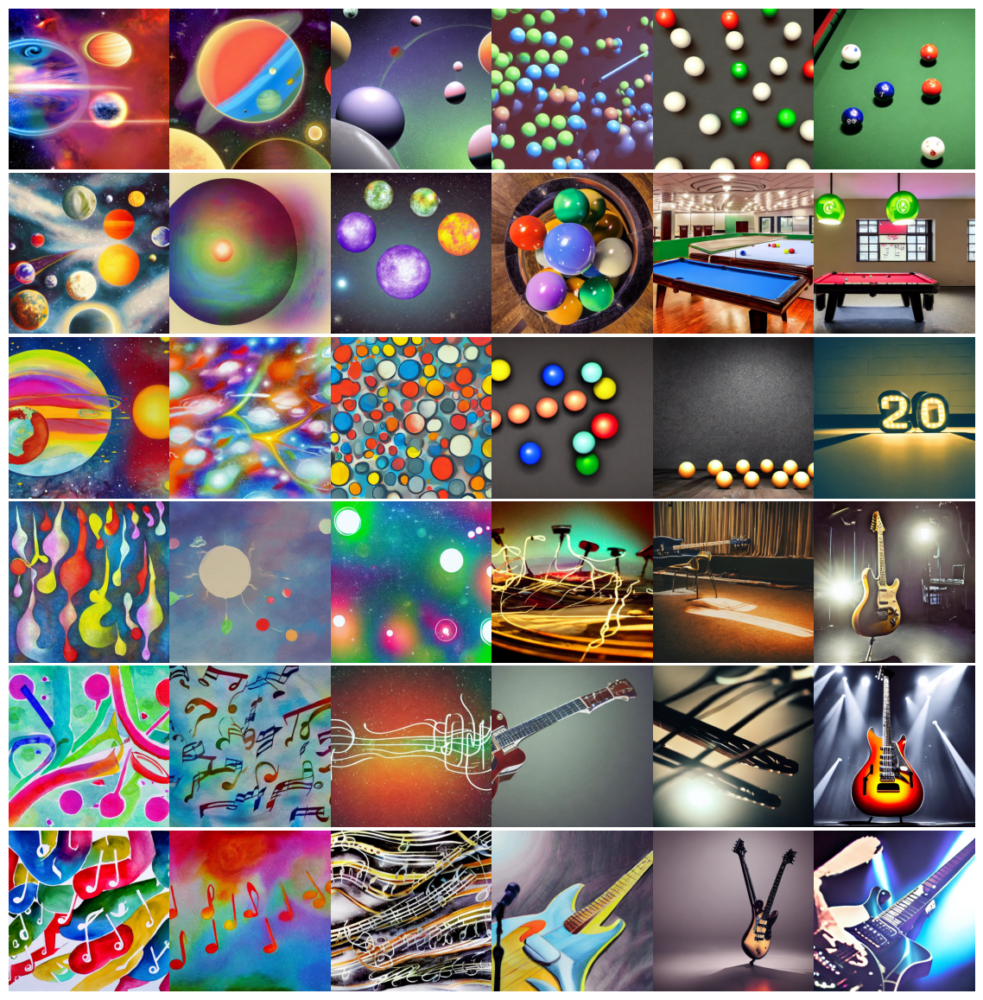

In [7]:
def plot_grid(images, path, grid_size, scale=2):
    fig, axs = plt.subplots(
        grid_size, grid_size, figsize=(grid_size * scale, grid_size * scale)
    )
    fig.tight_layout()
    plt.subplots_adjust(wspace=0, hspace=0)
    plt.margins(x=0, y=0)
    plt.axis("off")

    for ax in axs.flat:
        ax.axis("off")

    for i in range(min(grid_size * grid_size, len(images))):
        ax = axs.flat[i]
        ax.imshow(np.array(images[i]))
        ax.axis("off")

    for i in range(len(images), grid_size * grid_size):
        axs.flat[i].axis("off")
        axs.flat[i].remove()

    plt.savefig(
        fname=path,
        pad_inches=0,
        bbox_inches="tight",
        transparent=False,
        dpi=60,
    )
    print(f"Grid saved as {path}")


prompt_1 = "A group of colorful planets floating in the space, each with its unique features like rings, moons, and swirling clouds"
prompt_2 = "A group of billiard balls with numbers on a green pool table, reflecting bright lights from above"
prompt_3 = "A watercolor painting of musical notes floating in the air"
prompt_4 = "A photorealistic image of an electric guitar on a stage with dramatic lighting"

interpolation_steps = 6
grid_size = interpolation_steps
batch_size = 3
batches = (interpolation_steps**2) // batch_size
remaining = (interpolation_steps**2) % batch_size

seed = 12345
torch.manual_seed(seed)
generator = torch.Generator(device="cuda").manual_seed(seed)

alphas_x = np.linspace(0, 1, interpolation_steps)
alphas_y = np.linspace(0, 1, interpolation_steps)

all_pairs = []
for alpha_y in alphas_y:
    for alpha_x in alphas_x:
        all_pairs.append((alpha_x, alpha_y))

all_images = []

print(f"Generating {interpolation_steps}x{interpolation_steps} interpolation grid in {batches} batches...")
for batch_idx in tqdm(range(batches)):
    batch_start = batch_idx * batch_size
    batch_end = batch_start + batch_size
    batch_pairs = all_pairs[batch_start:batch_end]

    batch_images = []
    for alpha_x, alpha_y in batch_pairs:
        top_encoding = interpolate_embeddings(pipe, prompt_1, prompt_2, alpha_x)
        bottom_encoding = interpolate_embeddings(pipe, prompt_3, prompt_4, alpha_x)

        final_encoding = interpolate_embeddings(pipe, "", "", alpha_y)
        final_encoding = (1 - alpha_y) * top_encoding + alpha_y * bottom_encoding

        with torch.no_grad():
            image = pipe(
                prompt_embeds=final_encoding,
                guidance_scale=7.5,
                num_inference_steps=30,
                generator=generator
            ).images[0]

        batch_images.append(image)

    all_images.extend(batch_images)

if remaining > 0:
    batch_start = batches * batch_size
    batch_pairs = all_pairs[batch_start:]

    batch_images = []
    for alpha_x, alpha_y in batch_pairs:
        top_encoding = interpolate_embeddings(pipe, prompt_1, prompt_2, alpha_x)
        bottom_encoding = interpolate_embeddings(pipe, prompt_3, prompt_4, alpha_x)
        final_encoding = (1 - alpha_y) * top_encoding + alpha_y * bottom_encoding

        with torch.no_grad():
            image = pipe(
                prompt_embeds=final_encoding,
                guidance_scale=7.5,
                num_inference_steps=30,
                generator=generator
            ).images[0]

        batch_images.append(image)

    all_images.extend(batch_images)

plot_grid(all_images, "4-way-interpolation.jpg", interpolation_steps)

We can also interpolate while allowing diffusion noise to vary by dropping
the `diffusion_noise` parameter:

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

Grid saved as 4-way-interpolation-varying-noise.jpg


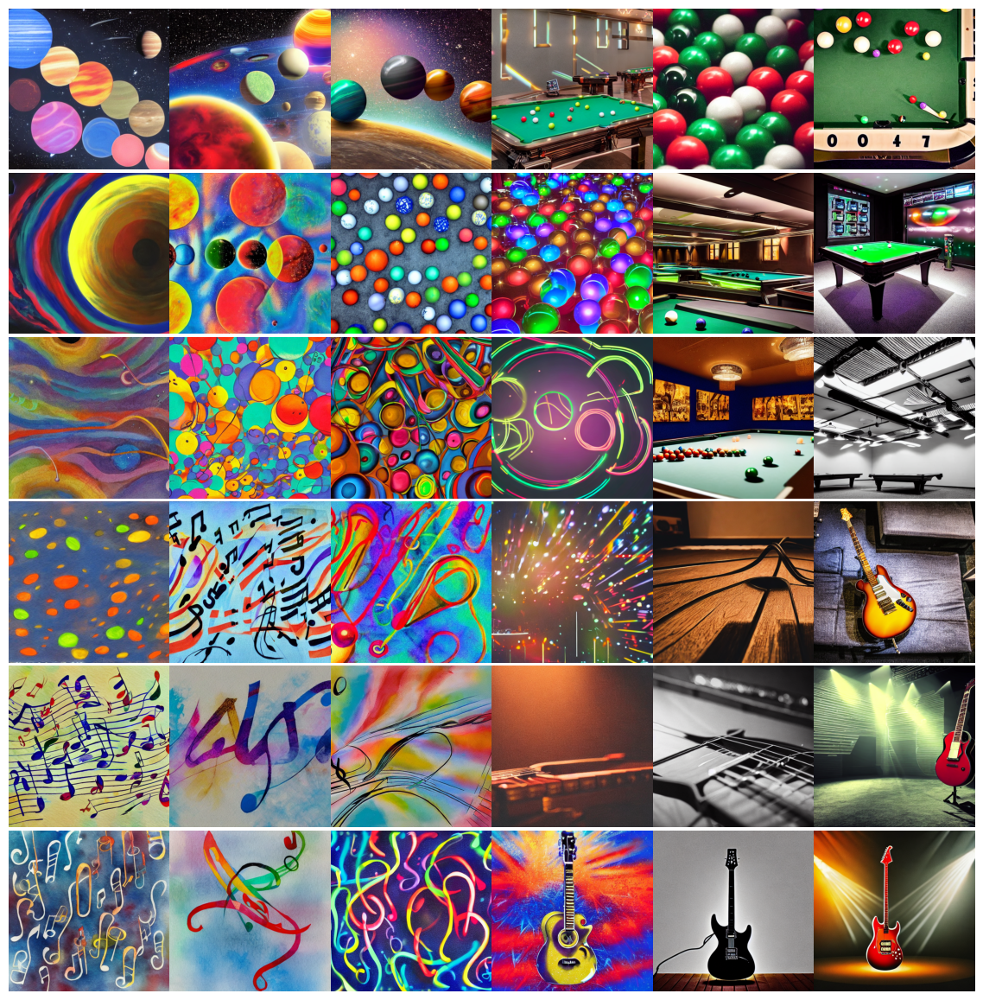

In [8]:
batched_encodings = []
for batch_idx in range(batches):
    batch_start = batch_idx * batch_size
    batch_end = min(batch_start + batch_size, interpolation_steps**2)

    current_batch = []
    for i in range(batch_start, batch_end):
        y_idx = i // interpolation_steps
        x_idx = i % interpolation_steps
        alpha_y = y_idx / (interpolation_steps - 1)
        alpha_x = x_idx / (interpolation_steps - 1)

        top_encoding = interpolate_embeddings(pipe, prompt_1, prompt_2, alpha_x)
        bottom_encoding = interpolate_embeddings(pipe, prompt_3, prompt_4, alpha_x)

        final_encoding = (1 - alpha_y) * top_encoding + alpha_y * bottom_encoding
        current_batch.append(final_encoding)

    batched_encodings.append(current_batch)

images = []
for batch_idx in range(batches):
    current_batch_images = []
    for encoding in batched_encodings[batch_idx]:
        random_seed = np.random.randint(0, 2147483647)
        generator = torch.Generator(device="cuda").manual_seed(random_seed)

        with torch.no_grad():
            image = pipe(
                prompt_embeds=encoding,
                guidance_scale=7.5,
                num_inference_steps=30,
                generator=generator
            ).images[0]

        current_batch_images.append(np.array(image))

    images.append(np.array(current_batch_images))

images = np.concatenate(images)

plot_grid(images, "4-way-interpolation-varying-noise.jpg", interpolation_steps)

Next up -- let's go for some walks!

## A walk around a text prompt

Our next experiment will be to go for a walk around the latent manifold
starting from a point produced by a particular prompt.

In [20]:
walk_steps = 150
batch_size = 3
batches = walk_steps // batch_size
step_size = 0.002
prompt = "A photorealistic robot painting a self-portrait"

text_input = pipe.tokenizer(
    prompt,
    padding="max_length",
    max_length=pipe.tokenizer.model_max_length,
    truncation=True,
    return_tensors="pt"
)
text_input = {k: v.to(pipe.device) for k, v in text_input.items()}

with torch.no_grad():
    embedding = pipe.text_encoder(**text_input).last_hidden_state

encoding = embedding.to(dtype=torch.float16)
print(f"Encoding shape: {encoding.shape}, dtype: {encoding.dtype}")

delta = torch.ones_like(encoding) * step_size

walked_encodings = []
current_encoding = encoding.clone()

print("Generating walked encodings...")
for step_index in range(walk_steps):
    walked_encodings.append(current_encoding.clone())
    current_encoding += delta

walked_encodings = torch.stack(walked_encodings)

latents_shape = (1, 4, 64, 64)
generator = torch.Generator(device="cuda").manual_seed(12345)
noise = torch.randn(latents_shape, generator=generator, device=pipe.device, dtype=torch.float16)

images = []
print(f"Generating {walk_steps} images in {batches} batches...")
for batch_idx in tqdm(range(batches)):
    batch_start = batch_idx * batch_size
    batch_end = min(batch_start + batch_size, walk_steps)

    for step_idx in range(batch_start, batch_end):

        text_embedding = walked_encodings[step_idx]

        uncond_input = pipe.tokenizer(
            [""],
            padding="max_length",
            max_length=pipe.tokenizer.model_max_length,
            return_tensors="pt"
        )
        uncond_input = {k: v.to(pipe.device) for k, v in uncond_input.items()}

        with torch.no_grad():
            uncond_embeddings = pipe.text_encoder(**uncond_input).last_hidden_state


        text_embedding = text_embedding.to(dtype=torch.float16)
        uncond_embeddings = uncond_embeddings.to(dtype=torch.float16)


        text_embeddings = torch.cat([uncond_embeddings, text_embedding])

        with torch.no_grad():
            image = pipe(
                prompt_embeds=text_embeddings,
                guidance_scale=7.5,
                num_inference_steps=25,
                generator=generator,
            ).images[0]

        images.append(image)

export_as_gif(
    "robot-painting.gif",
    images,
    frames_per_second=10,
    rubber_band=True
)

Encoding shape: torch.Size([1, 77, 768]), dtype: torch.float16
Generating walked encodings...
Generating 150 images in 50 batches...


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


  0%|          | 0/25 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


  0%|          | 0/25 [00:00<?, ?it/s]

  2%|▏         | 1/50 [00:04<03:29,  4.28s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


  0%|          | 0/25 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


  0%|          | 0/25 [00:00<?, ?it/s]

  4%|▍         | 2/50 [00:08<03:24,  4.26s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.
  6%|▌         | 3/50 [00:12<03:19,  4.25s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.
  8%|▊         | 4/50 [00:17<03:16,  4.27s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

 10%|█         | 5/50 [00:21<03:11,  4.25s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.
 12%|█▏        | 6/50 [00:25<03:07,  4.25s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

 14%|█▍        | 7/50 [00:29<03:02,  4.24s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


  0%|          | 0/25 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


  0%|          | 0/25 [00:00<?, ?it/s]

 16%|█▌        | 8/50 [00:33<02:57,  4.24s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.
 18%|█▊        | 9/50 [00:38<02:53,  4.24s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


  0%|          | 0/25 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


  0%|          | 0/25 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.
 20%|██        | 10/50 [00:42<02:49,  4.24s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.
 22%|██▏       | 11/50 [00:46<02:45,  4.24s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


  0%|          | 0/25 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


  0%|          | 0/25 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.
 24%|██▍       | 12/50 [00:50<02:40,  4.24s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


  0%|          | 0/25 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


  0%|          | 0/25 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.
 26%|██▌       | 13/50 [00:55<02:36,  4.23s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


  0%|          | 0/25 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


  0%|          | 0/25 [00:00<?, ?it/s]

 28%|██▊       | 14/50 [00:59<02:32,  4.23s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.
 30%|███       | 15/50 [01:03<02:28,  4.24s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

 32%|███▏      | 16/50 [01:07<02:23,  4.23s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.
 34%|███▍      | 17/50 [01:12<02:19,  4.22s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


  0%|          | 0/25 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


  0%|          | 0/25 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.
 36%|███▌      | 18/50 [01:16<02:15,  4.23s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


  0%|          | 0/25 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.
 38%|███▊      | 19/50 [01:20<02:10,  4.22s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.
 40%|████      | 20/50 [01:24<02:07,  4.24s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

 42%|████▏     | 21/50 [01:29<02:02,  4.24s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


  0%|          | 0/25 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


  0%|          | 0/25 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.
 44%|████▍     | 22/50 [01:33<01:58,  4.24s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.
 46%|████▌     | 23/50 [01:37<01:54,  4.25s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


  0%|          | 0/25 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


  0%|          | 0/25 [00:00<?, ?it/s]

 48%|████▊     | 24/50 [01:41<01:50,  4.24s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

 50%|█████     | 25/50 [01:45<01:45,  4.24s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


  0%|          | 0/25 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.
 52%|█████▏    | 26/50 [01:50<01:41,  4.24s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


  0%|          | 0/25 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


  0%|          | 0/25 [00:00<?, ?it/s]

 54%|█████▍    | 27/50 [01:54<01:37,  4.24s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


  0%|          | 0/25 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


  0%|          | 0/25 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.
 56%|█████▌    | 28/50 [01:58<01:33,  4.25s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.
 58%|█████▊    | 29/50 [02:03<01:29,  4.25s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.
 60%|██████    | 30/50 [02:07<01:24,  4.25s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


  0%|          | 0/25 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


  0%|          | 0/25 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.
 62%|██████▏   | 31/50 [02:11<01:20,  4.25s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


  0%|          | 0/25 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


  0%|          | 0/25 [00:00<?, ?it/s]

 64%|██████▍   | 32/50 [02:15<01:16,  4.25s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


  0%|          | 0/25 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.
 66%|██████▌   | 33/50 [02:19<01:12,  4.25s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


  0%|          | 0/25 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


  0%|          | 0/25 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.
 68%|██████▊   | 34/50 [02:24<01:07,  4.25s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


  0%|          | 0/25 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


  0%|          | 0/25 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.
 70%|███████   | 35/50 [02:28<01:03,  4.25s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


  0%|          | 0/25 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


  0%|          | 0/25 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.
 72%|███████▏  | 36/50 [02:32<00:59,  4.26s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


  0%|          | 0/25 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


  0%|          | 0/25 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.
 74%|███████▍  | 37/50 [02:36<00:55,  4.25s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


  0%|          | 0/25 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


  0%|          | 0/25 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.
 76%|███████▌  | 38/50 [02:41<00:50,  4.24s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


  0%|          | 0/25 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


  0%|          | 0/25 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.
 78%|███████▊  | 39/50 [02:45<00:46,  4.24s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


  0%|          | 0/25 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


  0%|          | 0/25 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.
 80%|████████  | 40/50 [02:49<00:42,  4.26s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


  0%|          | 0/25 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


  0%|          | 0/25 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.
 82%|████████▏ | 41/50 [02:54<00:38,  4.26s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


  0%|          | 0/25 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


  0%|          | 0/25 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.
 84%|████████▍ | 42/50 [02:58<00:34,  4.26s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


  0%|          | 0/25 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


  0%|          | 0/25 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.
 86%|████████▌ | 43/50 [03:02<00:29,  4.24s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


  0%|          | 0/25 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


  0%|          | 0/25 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.
 88%|████████▊ | 44/50 [03:06<00:25,  4.25s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


  0%|          | 0/25 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


  0%|          | 0/25 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.
 90%|█████████ | 45/50 [03:10<00:21,  4.24s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


  0%|          | 0/25 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


  0%|          | 0/25 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.
 92%|█████████▏| 46/50 [03:15<00:16,  4.24s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


  0%|          | 0/25 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.
 94%|█████████▍| 47/50 [03:19<00:12,  4.24s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


  0%|          | 0/25 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


  0%|          | 0/25 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.
 96%|█████████▌| 48/50 [03:23<00:08,  4.24s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


  0%|          | 0/25 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


  0%|          | 0/25 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.
 98%|█████████▊| 49/50 [03:27<00:04,  4.24s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


  0%|          | 0/25 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


  0%|          | 0/25 [00:00<?, ?it/s]

100%|██████████| 50/50 [03:32<00:00,  4.24s/it]


![Robot painting](https://i.imgur.com/3q9Ww22.gif)

Perhaps unsurprisingly, walking too far from the encoder's latent manifold
produces images that look incoherent. Try it for yourself by setting
your own prompt, and adjusting `step_size` to increase or decrease the magnitude
of the walk. Note that when the magnitude of the walk gets large, the walk often
leads into areas which produce extremely noisy images.

## A circular walk through the diffusion noise space for a single prompt

Our final experiment is to stick to one prompt and explore the variety of images
that the diffusion model can produce from that prompt. We do this by controlling
the noise that is used to seed the diffusion process.

We create two noise components, `x` and `y`, and do a walk from 0 to 2π, summing
the cosine of our `x` component and the sin of our `y` component to produce noise.
Using this approach, the end of our walk arrives at the same noise inputs where
we began our walk, so we get a "loopable" result!

In [21]:
prompt = "The Colosseum in the style of starry night"

walk_steps = 30
batch_size = 3
batches = walk_steps // batch_size

noise_shape = (1, 4, 64, 64)
walk_noise_x = torch.randn(noise_shape, device="cuda", dtype=torch.float16)
walk_noise_y = torch.randn(noise_shape, device="cuda", dtype=torch.float16)

walk_scale_x = torch.cos(torch.linspace(0, 2, walk_steps) * math.pi).to("cuda").half()
walk_scale_y = torch.sin(torch.linspace(0, 2, walk_steps) * math.pi).to("cuda").half()

noise_x = torch.tensordot(walk_scale_x, walk_noise_x, dims=0)
noise_y = torch.tensordot(walk_scale_y, walk_noise_y, dims=0)
noise = noise_x + noise_y

batched_noise = torch.split(noise, batch_size)

images = []
for batch in batched_noise:
    batch = batch.squeeze(1)
    for z in batch:
        image = pipe(prompt, latents=z.unsqueeze(0)).images[0]  # z ya es float16
        images.append(image)

# Exporta como gif
images[0].save(
    "colosseum-starry-night.gif",
    save_all=True,
    append_images=images[1:],
    duration=100,
    loop=0
)

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

![Colosseum starry night](https://i.imgur.com/SIphgIg.gif)

Experiment with your own prompts and with different values of
`unconditional_guidance_scale`!

## Conclusion

Stable Diffusion offers a lot more than just single text-to-image generation.
Exploring the latent manifold of the text encoder and the noise space of the
diffusion model are two fun ways to experience the power of this model, and
KerasCV makes it easy!